In [1]:
import os
import time                                                                                                      
import math                                                                                                      
import operator                                                                                                  
import csv                                                                                                       
import glob                                                                                                      
import cv2                                                                                                       
import pickle                                                                                                    
import numpy as np                                                                                               
import pandas as pd                                                                                              
import matplotlib.pyplot as plt                                                                                  
from scipy import ndimage                                                                                                                                                                  
from sklearn.ensemble import RandomForestClassifier                                                              
from sklearn.model_selection import train_test_split                                                             
from sklearn.model_selection import RandomizedSearchCV                                                           
from sklearn.model_selection import GridSearchCV                                                                                                                                
from IPython.display import display, HTML                                    
from IPython.display import Markdown, display
from tkinter.filedialog import askdirectory
from tkinter.filedialog import askopenfilename



def calculate_time(tstart,tstop):
    process_time = (tstop-tstart)
    mins, sec = divmod(process_time, 60)                                                        
    return '{:02.0f} min:{:02.0f} sec'.format(mins,sec) 


# This function finds contours in an input image and returns them along with their hierarchies 
# and the Canny edge detection of the image.
def find_contours(img_cnt, method, sigma = 0.33):
    # Convert the input image to grayscale.
    img_cnt_bw = cv2.cvtColor(img_cnt, cv2.COLOR_BGR2GRAY)                                                            
    # Apply Gaussian blur to reduce noise in the image.
    blurred = cv2.GaussianBlur(img_cnt_bw, (3, 3), 0)
    # Apply Otsu thresholding to segment the image.
    th_cnt_value, th_cnt_img = cv2.threshold(blurred,100,200,cv2.THRESH_OTSU)                    
    # Perform morphological closing to fill gaps in the edges of the image.
    kernel_close = np.ones((3, 3), np.uint8)                                                     
    morph_cnt_img = cv2.morphologyEx(th_cnt_img, cv2.MORPH_CLOSE, kernel_close)                     
    # Apply Canny edge detection to the closed image.
    v = np.median(morph_cnt_img)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(morph_cnt_img, lower, upper) 
    # Find contours in the edged image based on the method argument.
    if method == "EXTERNAL":
        contours_img_cnt, hierarchy_img_cnt = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
    elif method == "TREE":
        contours_img_cnt, hierarchy_img_cnt = cv2.findContours(edged, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) 
    # Return the contours, hierarchies, and edged image.
    return contours_img_cnt, hierarchy_img_cnt, edged


# This function removes contours based on their properties such as the number of corners, area-to-perimeter ratio, and height.
def contour_removal_properties(image, min_corners, max_corners, min_ratio, max_ratio, min_height, max_height):
    # Find all contours in the input image.
    contours_found, __ = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) 
    # Loop through all contours and remove those that do not meet the criteria.
    for c, cnt in enumerate(contours_found):                                                           
        perimeter, area, corners = contour_properties(cnt)
        height, width = shape_height_width(cnt)
        if not min_corners < corners < max_corners or min_ratio < area/perimeter < max_ratio or min_height < height < max_height:
            contours_found.pop(c) 
    # Return the remaining contours.
    return contours_found


# This function removes contours based on their distance from a given centerpoint.
def contour_removal_distance_centerpoints(contour_space, contour_space_center_x, contour_space_center_y, dist_min):
    # Loop through all contours in the contour space.
    for i, cnt in enumerate(contour_space):
        # Find the centroid of the contour.
        M = cv2.moments(cnt)
        cx = int(M['m10']/M['m00'])
        cy = int(M['m01']/M['m00'])
        # If the distance between the centroid and the centerpoint is greater than the minimum distance, remove the contour.
        if ((((cx - contour_space_center_x)**2) + ((contour_space_center_y)**2))**0.5) > dist_min:
            contours_space.pop(i)
    return contour_space


# This function takes an input image of children and returns the number of youngest children found 
# along with an output image highlighting the location of these children.
def yougest_children_img(image_children):
    # Find contours and hierarchy of the image using find_contours() function.
    contours_space_cnt, hierarchy_space_cnt, ____= find_contours(image_children, "TREE")
    # Get the hierarchy for the first contour as it represents the entire image.
    hierarchy_space_cnt = hierarchy_space_cnt[0]
    # Make a copy of the input image to draw the output rectangles on.
    hierarchy_children_img = image_children.copy()
    # Keep track of the number of youngest children found.
    children_found = 0
    # Loop through each contour and hierarchy pair.
    for component in zip(contours_space_cnt, hierarchy_space_cnt):
        # Get the current contour and hierarchy.
        currentContour = component[0]
        currentHierarchy = component[1]
        # Get the bounding rectangle coordinates for the current contour.
        x,y,w,h = cv2.boundingRect(currentContour)
        # Check if the current contour has no child (i.e., youngest child).
        if currentHierarchy[2] < 0:                                                       
            # Draw a red rectangle around the youngest child on the hierarchy_children_img.
            cv2.rectangle(hierarchy_children_img ,(x,y),(x+w,y+h),(0,0,255),3)
            # Increment the count of the youngest children found.
            children_found += 1
    # Return the number of youngest children found and the output image with rectangles around them.
    return children_found, hierarchy_children_img


# This function is used to find the center of the contour along with its x and y coordinates.
def find_center(image):
    contour_bw = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thr_value2, th_shape_img = cv2.threshold(contour_bw,127,255,cv2.THRESH_OTSU) 
    kernel_close = np.ones((3, 3), np.uint8)
    # Apply morphological closing on the thresholded image to remove any holes.
    morph_shape_img = cv2.morphologyEx(th_shape_img , cv2.MORPH_CLOSE, kernel_close)
    # Detect edges using Canny edge detection.
    canny_shape_img = cv2.Canny(morph_shape_img, 150, 500)  
    # Find contours and hierarchy of the Canny edge-detected image.
    contours_shape, hierarchy_shape = cv2.findContours(canny_shape_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    # Make a copy of the input image to draw the center circle and label on.
    center_identified_img = image.copy()
    # Get the moments of the first contour (i.e., entire image).
    M = cv2.moments(contours_shape[1])
    if M['m00'] != 0:
        cx = int(M['m10']/M['m00'])
        cy = int(M['m01']/M['m00'])
        # Draw a red circle at the center and label it on the center_identified_img.
        cv2.circle(center_identified_img, (cx, cy), 7, (0, 0, 255), -1)
        cv2.putText(center_identified_img, "CENTER", (cx - 30, cy - 10),
                 cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
        return center_identified_img, cx, cy
    else:
        return center_identified_img, 0, 0

# Function to extract the contour of an object from an image
def contour_extraction(image, contours_space, cnt):
    mask = np.zeros_like(image) 
    cv2.drawContours(mask, contours_space, cnt, 255, -1) 
    masked = np.zeros_like(image) 
    masked[mask == 255] = image[mask == 255]
    return masked
# Function to crop an image based on the contour of an object
def contour_bound_crop(img, cnts, cnt):
    [x,y,w,h] = cv2.boundingRect(cnts[cnt])
    box = cv2.rectangle(img.copy(), (x, y), (x + w, y + h), (0,0,255), 2)
    cropped = img[y-10:y+h+10, x-10:x+w+10]
    return cropped, box

# Function to sharpen an image
def sharpen_image(image, sharpness, threshold):
    blurred = cv2.GaussianBlur(image, (5,5) , 1.0)
    sharpened = float(sharpness + 1) * image - float(sharpness) * blurred
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    if threshold > 0:
        low_contrast_mask = np.absolute(image - blurred) < threshold
        np.copyto(sharpened, image, where=low_contrast_mask)
    return sharpened
# Function to calculate properties of a contour (perimeter, area, corners)
def contour_properties(contour_selected, req):
    perimeter = cv2.arcLength(contour_selected, True)                                                        
    area = cv2.contourArea(contour_selected)                                                                     
    corners = len(cv2.approxPolyDP(contour_selected, 0.04*perimeter, True))
    if req == "A":
        return area
    elif req == "P":
        return perimeter
    elif req == "C":
        return corners

# Function to fit an ellipse to a contour and return the minor and major axis lengths
def fit_ellipse(contour_selected):
    try:
        ellipse_found = cv2.fitEllipse(contour_selected)                                                  
        (center, axes, orientation) = ellipse_found                                                       
        majoraxis_length = max(axes)                              
        minoraxis_length = min(axes)
        return minoraxis_length, majoraxis_length
    except (cv2.error, ZeroDivisionError) as e:
        return 0, 0

# Function to calculate the height or width of a shape based on the minor and major axis lengths of its fitted ellipse
def shape_height_width(contour_selected, val):
    try:
        minor, major = fit_ellipse(contour_selected)
        if val == "H":
            return major/minor
        if val == "W":
            return minor/major
    except (cv2.error, ZeroDivisionError) as e:
        return 0

# Function to create a mask of a contour on a morphology image
def contour_masking(morphology, cnts, selected):
    mask = np.zeros_like(morphology)                                                               
    cv2.drawContours(mask, cnts, selected, 255, -1)                                       
    masked = np.zeros_like(morphology)                                                    
    masked[mask == 255] = morphology[mask == 255]
    return masked

       
            

def identify_camera():
    camera = cv2.VideoCapture(0)  
    camera.set(cv2.CAP_PROP_FRAME_WIDTH, 800)                                                              
    camera.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)                                                             
    camera.set(cv2.CAP_PROP_FPS, 30)
    area_sensitivity = 8000                 
    
    while True:                                                                                           
        rfc = pickle.load(open("trained_rfc_classifier.p", "rb")) 
        _, frame = camera.read()
        hsvframe = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)                                                  
        kernel = np.ones((5,5), "uint8")                                                                   

        # define range wanted color in HSV
        red_lower1, red_upper1 = np.array([0,50,20], np.uint8), np.array([10,255,255], np.uint8) 
        red_lower2, red_upper2 = np.array([160, 90, 90], np.uint8), np.array([180, 255, 255], np.uint8)
        red_mask1, red_mask2 = cv2.inRange(hsvframe, red_lower1, red_upper1), cv2.inRange(hsvframe, red_lower2, red_upper2)
        red_mask = cv2.bitwise_or(red_mask1, red_mask2)
        green_lower, green_upper = np.array([45, 100, 50], np.uint8), np.array([75, 255, 255], np.uint8)                                                     
        green_mask = cv2.inRange(hsvframe, green_lower, green_upper)
        blue_lower, blue_upper = np.array([87, 150, 80], np.uint8), np.array([117, 255, 255], np.uint8)                                                     
        blue_mask = cv2.inRange(hsvframe, blue_lower, blue_upper)
        yellow_lower, yellow_upper = np.array([15,80,90], np.uint8), np.array([40,255,255], np.uint8)
        yellow_mask = cv2.inRange(hsvframe, yellow_lower, yellow_upper)


        red_mask = cv2.dilate(red_mask, kernel)                                                            
        res_red = cv2.bitwise_and(frame, frame, mask = red_mask)                                           
        green_mask = cv2.dilate(green_mask, kernel)                                                        
        res_green = cv2.bitwise_and(frame, frame, mask = green_mask)                                       
        blue_mask = cv2.dilate(blue_mask, kernel)                                                          
        res_blue = cv2.bitwise_and(frame, frame, mask = blue_mask)                                         
        yellow_mask = cv2.dilate(yellow_mask, kernel)                                                      
        res_yellow = cv2.bitwise_and(frame, frame, mask = yellow_mask)                                                                           
 
        masks = [red_mask, green_mask, blue_mask, yellow_mask]
        for n, mask in enumerate(masks):
            contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)            
            for j, cnts in enumerate(contours):                                                             
                area = cv2.contourArea(cnts)                                                                
                if(area > area_sensitivity):                                                                 
                    try:
                        if n == 0: card_name = "RED "; text_colour = (0,0,255)
                        if n == 1: card_name = "GREEN "; text_colour = (0,255,0)
                        if n == 2: card_name = "BLUE "; text_colour = (255,0,0)
                        if n == 3: card_name = "YELLOW "; text_colour = (0,255,255)
                        x, y, w, h = cv2.boundingRect(cnts) 
                        processing_frame = frame[y:y+h, x:x+w]
                        validation = list(processing_frame.shape)
                        validation = validation[:-1]
                        if validation[0] > validation[1]:
                            b,g,r = frame[int((x+w+70)/2), int((y+h+270)/2)]
                            center_frame = center_shape(processing_frame, 40, 60, b,g,r) 
                        else:
                            b,g,r = frame[int((y+h+270)/2), int((x+w+70)/2)]
                            center_frame = center_shape(processing_frame, 60, 40, b,g,r) 
                        contours_center, hierarchy_center, canny_center_img = find_contours(center_frame, "EXTERNAL")                       
                        features_camera, titles_camera, images_camera = features_extraction(contours_center, hierarchy_center, center_frame, canny_center_img)
                        features_array = (np.array(features_camera)).reshape(1, -1)
                        result = int(rfc.predict(features_array))
                        text = (card_name + str(result_processing(result)) + " UNO CARD").upper()                                      
                        
                    except (TypeError, IndexError, ZeroDivisionError, cv2.error) as e:
                        continue
                    cv2.imshow("canny_center_img", canny_center_img)
                    frame = cv2.rectangle(frame, (x, y), (x + w, y + h), text_colour, 2)                                               
                    cv2.putText(frame, text, (x, y), cv2.FONT_HERSHEY_SIMPLEX,0.7, text_colour, 2, cv2.LINE_AA)  

        cv2.imshow("UNO Card Detection", frame)                                                            
        if cv2.waitKey(10) == ord('q'):                                                                    
            camera.release()                                                                               
            cv2.destroyAllWindows()                                                                        
            break                                                                                          
        


In [2]:

# This function applies the Harris corner detection algorithm to an input image and returns 
# the number of corners detected along with an image showing the detected corners.
def harris_method_corners(image):
    harris_method_BGR_img= image.copy()
    harris_method_bw_img = np.float32(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
    dst = cv2.cornerHarris(harris_method_bw_img,5,3,0.04)
    ret, dst = cv2.threshold(dst,0.1*dst.max(),255,0)
    dst = np.uint8(dst)
    ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
    harris_corners = cv2.cornerSubPix(harris_method_bw_img,np.float32(centroids),(5,5),(-1,-1),criteria)
    harris_method_BGR_img[dst>0.1*dst.max()]=[0,0,255]   
    
    for c in range(1, len(harris_corners)):
        cv2.circle(harris_method_BGR_img, (int(harris_corners[c,0]), int(harris_corners[c,1])), 7, (0,255,0), 2)
    
    return c, harris_method_BGR_img

# This function applies the Shi-Tomasi corner detection algorithm to an input image and 
# returns the number of corners detected along with an image showing the detected corners.
def shi_tomasi_method_corners(image):
    shi_tomasi_BGR_img= image.copy()
    shi_tomasi_method_bw_img = cv2.cvtColor(shi_tomasi_BGR_img, cv2.COLOR_BGR2GRAY)
    shi_tomasi_corners = cv2.goodFeaturesToTrack(shi_tomasi_method_bw_img, 0, 0.25, 0.05)
    shi_tomasi_corners = np.int0(shi_tomasi_corners)
    # draw red color circles on all corners                                                                                              
    for i in shi_tomasi_corners:                                                                                    
        x, y = i.ravel()
        cv2.circle(shi_tomasi_BGR_img, (x, y), 3, (0, 0, 255), -1)
    return len(shi_tomasi_corners), shi_tomasi_BGR_img

# This function applies the Hough circle detection algorithm to an input image and 
# returns the number of circles detected, an image showing the detected circles, and 
# the total distance between the center of the image and the center of each detected circle.
def houghcircles(image, min_radius, max_radius, circle_dist):
    ___, center_x, center_y = find_center(image)
    circles_count = 0   
    houghcircles_BGR_img= image.copy()
    houghcircles_bw_img = cv2.cvtColor(houghcircles_BGR_img, cv2.COLOR_BGR2GRAY)
    rows = houghcircles_bw_img.shape[0]
    circles = cv2.HoughCircles(houghcircles_bw_img, cv2.HOUGH_GRADIENT, 1, rows / circle_dist,
                               param1=100, param2=30, minRadius=min_radius, maxRadius=max_radius)
    
    dist_center_circle = 0
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1]) 
            dist_center_circle += int(math.sqrt((center_x - center[0])**2 + (center_y - center[1])**2))
            cv2.circle(houghcircles_BGR_img, center, 1, (0, 100, 100), 3)                                    
            radius = i[2]                                                                              
            cv2.circle(houghcircles_BGR_img, center, radius, (255, 0, 255), 3)
        circles_count = int(circles.size/3)
    return circles_count, houghcircles_BGR_img, dist_center_circle

# This function applies the Hough line detection algorithm to an input image and 
# returns the number of lines detected, an image showing the detected lines, and 
# the number of pairs of detected lines that are parallel.
def houghlines(image, canny_edges):
    lines_img = image.copy()
    rho = 1  
    theta = np.pi / 10  
    threshold = 17 
    min_line_length = 15 
    max_line_gap = 18 
    line_image = np.copy(image) * 0  

    lines = cv2.HoughLinesP(canny_edges, rho, theta, threshold, np.array([]),
                        min_line_length, max_line_gap)
    line_counter = 0
    if lines is not None:
        for line in lines:
            for x1,y1,x2,y2 in line:
                line_counter += 1
                cv2.line(line_image,(x1,y1),(x2,y2),(0,0,255),5)

        lines_edges = cv2.addWeighted(lines_img, 1, line_image, 1, 0)

        parallel = []
        for i in range(len(lines)):
            for j in range(len(lines)):
                if (i == j):continue
                if (abs(lines[i][0][1] - lines[j][0][1]) == 0):         
                    parallel.append((i,j))
        return line_counter, lines_edges, len(parallel)

def center_shape(img_frame, mina, maxa, b, g, r):
    mask = np.zeros_like(img_frame)
    rows, cols,_ = mask.shape
    center_x = int(rows/2)
    center_y = int(cols/2)
    center = (center_y,center_x)

    mask = cv2.ellipse(mask, center, axes=(mina, maxa), angle=24, startAngle=0, endAngle = 360, color=(255,255,255), thickness = -1)
    ellipse_masked_img = np.bitwise_and(img_frame, mask)
    ellipse_masked_img[np.all(ellipse_masked_img == (0, 0, 0), axis=-1)] = (b, g, r)

    return ellipse_masked_img
    

#To assign values for each shape
def card_type_name(filepath):
    card_type = filepath[-5:-4]
    if card_type == "R":
        card_type = 10;
    elif card_type == "S":
        card_type = 11;
    elif card_type == "T":
        card_type = 12;
    else:
        card_type = int(filepath[-5:-4])
    return card_type

def result_processing(variable):
    if variable == 10:
        variable = "REVERSE";
    elif variable == 11:
        variable = "SKIP";
    elif variable == 12:
        variable = "PLUS 2";
    else:
        variable = variable
    return variable   

# Function to generate a features array including the following parameters
# Ratio of area to perimeter
# Height of the shape
# Width of the shape
# Number of youngest children (in the image)
# Number of lines detected in the image
# Number of parallel line instances detected in the image
# Number of circles detected in the image
# Distance from center of the image to center of the circle (if circle is detected)
# Number of Harris corners detected in the image
# Number of Shi-Tomasi corners detected in the image
# Number of polygon corners found in the image
def features_extraction(contours_center, hierarchy_center, center_processing, canny_center_processing):
    contours_final = list()
    hierarchy_center = hierarchy_center[0]
    for component in zip(contours_center, hierarchy_center):
        currentContour = component[0]
        currentHierarchy = component[1]
        if currentHierarchy[2] < 0:
            contours_final.append(currentContour)

    height_found, width_found, area_found, perimeter_found, poly_corners_found = 0,0,0,0,0
    for c in range(len(contours_final)):
        # Draw the selected contour on the processed image
        drawn_contour_img = cv2.drawContours(center_processing.copy(), contours_final, c, (0, 255, 0), 2, cv2.LINE_AA)
        area_found += contour_properties(contours_final[c], "A")
        perimeter_found += contour_properties(contours_final[c], "P")
        poly_corners_found += contour_properties(contours_final[c], "C")
        height_found += shape_height_width(contours_final[c], "H") 
        width_found += shape_height_width(contours_final[c], "W") 

    ratio_found = area_found/perimeter_found    
    harris_corners, harris_corners_img = harris_method_corners(center_processing)
    shi_tomasi_corners, shi_tomasi_img = shi_tomasi_method_corners(center_processing)
    lines_found, lines_found_image, parallel_instances_found = houghlines(center_processing, canny_center_processing)
    circles_found, houghcircles_img, dist_from_center = houghcircles(center_processing, 20, 30, 8)
    children_found_counter, children_found_img = yougest_children_img(center_processing)

    features = [int(-(-ratio_found // 1)), float("{:.1f}".format(height_found)), float("{:.1f}".format(width_found)), children_found_counter, 
                                lines_found, parallel_instances_found, circles_found, dist_from_center, harris_corners, shi_tomasi_corners, poly_corners_found]
    
    titles = ['Ellipse Masked','Drawn Shape','Shi-Tomasi Corners','Harris Corners','Hough Circles','Children Found','Lines Found']
    images = [center_processing, drawn_contour_img, shi_tomasi_img, harris_corners_img, houghcircles_img, children_found_img, lines_found_image]
    
    return features, titles, images


In [3]:
 # Training Random Forest Classifier 

# Define a function for training a random forest classifier
def classifier_training(dataset):
    # Read in the dataset as a pandas dataframe
    dataset = pd.read_csv(dataset,header=None)
    # Extract the feature data from the dataframe
    X_train = dataset.iloc[:, 1:] 
    # Extract the target labels from the dataframe
    y_train = dataset.iloc[:, 0]

    # Start a timer to measure how long the function takes to run
    timer_start = time.monotonic()

    # Define a random forest classifier and the parameters to be tested
    rfc = RandomForestClassifier()
    param_random = { 
        'n_estimators': [100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None], 
        'bootstrap': [True, False]}

    # Perform a randomized search to find the best parameters
    rfc_random_search = RandomizedSearchCV(estimator = rfc, param_distributions = param_random, 
                                           n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
    rfc_random_search.fit(X_train, y_train)
    # Retrieve the best parameters found by the randomized search
    best_random_search = list(rfc_random_search.best_params_.values())

    # Define a new parameter grid based on the best parameters found in the randomized search
    param_grid = { 
        'n_estimators': [int(best_random_search[0]-100), int(best_random_search[0]-50), int(best_random_search[0]-25), int(best_random_search[0]),
                                                    int(best_random_search[0]+25), int(best_random_search[0])+50, int(best_random_search[0])+100],
        'min_samples_split': [int(best_random_search[1]/3), int(best_random_search[1]/2), int(best_random_search[1]), 
                                                         int(best_random_search[1]*2), int(best_random_search[1]*3)],
        'min_samples_leaf': [best_random_search[2]-1, best_random_search[1], best_random_search[1]+1],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_depth': [best_random_search[4]-10, best_random_search[4]-5, best_random_search[4], 
                                            best_random_search[4]+5, best_random_search[4]+10],
        'bootstrap': [best_random_search[5]]}

    # Perform a grid search with the new parameter grid to further optimize the classifier
    rfc_grid_search = GridSearchCV(estimator = rfc, param_grid = param_grid, 
                                   cv = 5, n_jobs = -1, verbose = 2)
    rfc_grid_search.fit(X_train, y_train)
    # Retrieve the best parameters found by the grid search
    best_grid_search = list(rfc_grid_search.best_params_.values())

    # Create a new random forest classifier with the best parameters found
    rfc_optimised = RandomForestClassifier(n_jobs=-1, bootstrap=best_grid_search[0], max_depth=best_grid_search[1], max_features=best_grid_search[2],
                                           min_samples_leaf=best_grid_search[3], min_samples_split=best_grid_search[4], n_estimators=best_grid_search[5])
    rfc_optimised.fit(X_train,y_train)
    pickle.dump(rfc_optimised, open("trained_rfc_classifier.p", "wb"))

    timer_stop = time.monotonic()
    timer = str(calculate_time(timer_start, timer_stop))       
    print('Operation Complete. The process took: ' + timer)


In [4]:
red_lower1 = np.array([0, 50, 20], np.uint8)                                                                       
red_upper1 = np.array([10, 255, 255], np.uint8)                                                                    
red_lower2 = np.array([160, 90, 90], np.uint8)                                                                     
red_upper2 = np.array([180, 255, 255], np.uint8)                                                                   
                                                                                                                   
green_lower = np.array([25, 37, 140], np.uint8)                                                                    
green_upper = np.array([43, 205, 181], np.uint8)                                                                   
 
blue_lower = np.array([87, 150, 80], np.uint8)                                                                     
blue_upper = np.array([117, 255, 255], np.uint8)                                                                   

yellow_lower = np.array([0, 88, 137], np.uint8)                                                                    
yellow_upper = np.array([28, 255, 235], np.uint8)                                                                  


# Image processing of the image
def process_image(image_filename):
    input_img = cv2.imread(image_filename)
    # Rotate the image by -90 degrees
    rotated_img = ndimage.rotate(input_img, -90) 
    # Convert the rotated image to grayscale
    bw_img = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY)                                                                         
    # Apply thresholding to the grayscale image
    thr_value, th_img = cv2.threshold(bw_img,150, 400, cv2.THRESH_BINARY_INV)
    # Apply morphological opening to the thresholded image
    kernel = np.ones((3, 3), np.uint8)                                                                  
    open_img = cv2.morphologyEx(th_img, cv2.MORPH_OPEN, kernel)                                         
    # Apply Canny edge detection to the opened image
    canny_img = cv2.Canny(open_img, 50, 100)     
    # Find contours in the opened image
    contours, _ = cv2.findContours(open_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)  
    # Select the second contour and draw it on the rotated image
    selected_contour = 1                                                                                   
    contours_img = cv2.drawContours(rotated_img, contours, selected_contour, (0, 255, 0), 2, cv2.LINE_AA)
  
    # Crop the contour from the rotated image
    x_cnt,y_cnt,w_cnt,h_cnt = cv2.boundingRect(contours[selected_contour])                                 
    contour_cropped_proc_img = (rotated_img.copy())[y_cnt-7:y_cnt+h_cnt+7, x_cnt-7:x_cnt+w_cnt+7] 
 
    # Get the resolution of the cropped image and resize it
    resolution_input_img = list(contour_cropped_proc_img.shape)
    resolution_input_img = resolution_input_img[:-1]
    if resolution_input_img[1] > resolution_input_img[0]:
        contour_cropped_proc_img = cv2.resize(contour_cropped_proc_img, (260, 173)) 
    else:
        contour_cropped_proc_img = cv2.resize(contour_cropped_proc_img, (173, 260))
    #add a black border around the cropped image
    contour_cropped_analysis_img = contour_cropped_proc_img.copy()                                
 
    framed_img = cv2.copyMakeBorder(contour_cropped_proc_img,                                             
                                    30,30,30,30,
                                    cv2.BORDER_CONSTANT,
                                    value=(0,0,0)) 
    # Find the center of the analysis image and extract a small patch of pixels
    center_analysis_img, center_analysis_x, center_analysis_y = find_center(contour_cropped_analysis_img)
    colour_patch_img = contour_cropped_analysis_img[center_analysis_y-55:center_analysis_y-45,center_analysis_x-225:center_analysis_x-215]                

    # Get the most frequent BGR values in the color patch
    bgr_pixels = colour_patch_img.tolist()                                                                 
    b = [x[0][0] for x in bgr_pixels]                                                                      
    g = [x[0][1] for x in bgr_pixels]                                                                      
    r = [x[0][2] for x in bgr_pixels]                                                                      
    frequent_b = (max(set(b), key = b.count))                                                              
    frequent_g = (max(set(g), key = g.count))                                                              
    frequent_r = (max(set(r), key = r.count)) 
    
    # Convert the cropped image of the contour to HSV color space
    hsv_colours = cv2.cvtColor(contour_cropped_proc_img, cv2.COLOR_BGR2HSV)
    named_colour = ''
    colour_rgb = [0,0,0]
    # Create masks for different colors
    red_mask1, red_mask2 = cv2.inRange(hsv_colours, red_lower1, red_upper1), cv2.inRange(hsv_colours, red_lower2, red_upper2)
    red_mask = cv2.bitwise_or(red_mask1, red_mask2)
    green_mask = cv2.inRange(hsv_colours, green_lower, green_upper)
    blue_mask = cv2.inRange(hsv_colours, blue_lower, blue_upper) 
    yellow_mask = cv2.inRange(hsv_colours, yellow_lower, yellow_upper)
    # Store the masks in a dictionary - to access them easily
    masks = {"red" : red_mask  , "green" : green_mask, "blue" : blue_mask, "yellow": yellow_mask}
    
    #set the named color variable to the corresponding color
    for n, item_masks in enumerate(masks.values()):
        pixels_counter = cv2.countNonZero(item_masks)  
        if np.sum(item_masks) > 0 and pixels_counter > 8000: named_colour = str(list(masks.keys())[n]); break 
        else: named_colour = str(list(masks.keys())[n])
    contour_cropped = contour_cropped_analysis_img.copy()   
    # Resize the cropped contour image to 200% of its original size
    scale_percent = 200
    dim =  (int(contour_cropped.shape[1] * scale_percent / 100), int(contour_cropped.shape[0] * scale_percent / 100))
    # Sharpen the resized image
    contour_cropped_resized = cv2.resize(contour_cropped, dim, interpolation = cv2.INTER_AREA)
    contour_cropped_sharpened = sharpen_image(contour_cropped_resized, 0.22, 0)
    # Apply Gaussian blur to the resized image
    kernel_size = 5
    contour_cropped_blurred = cv2.GaussianBlur(contour_cropped_resized,(kernel_size, kernel_size),0)
    # Find the coordinates of the center of the image
    center_img, center_x, center_y = find_center(contour_cropped_sharpened)
    ellipse_cropped = contour_cropped_blurred.copy()
    # If the height of the image is greater than the width, center the shape vertically
    # Otherwise, center the shape horizontally
    if resolution_input_img[1] > resolution_input_img[0]:
        ellipse_cropped = center_shape(ellipse_cropped, 165, 90, frequent_b, frequent_g, frequent_r)
    else:
        ellipse_cropped = center_shape(ellipse_cropped, 90, 165, frequent_b, frequent_g, frequent_r)

    contours_center, hierarchy_center, canny_center_img = find_contours(ellipse_cropped, "EXTERNAL")
    features, titles, images = features_extraction(contours_center, hierarchy_center, ellipse_cropped, canny_center_img)
    
    return features, named_colour, titles, images
    
    
    



In [5]:
# dataset creation from a folder of images
def create_dataset(path):
    timer_start = time.monotonic()
    for filepath in glob.iglob(path):
        card_selected = card_type_name(filepath)
        features_card, colour_card, titles_folder, images_folder = process_image(filepath)
        features_card.insert(0, card_selected)
        with open("dataset.csv", "a", newline='') as fp:
            wr = csv.writer(fp, dialect='excel')
            wr.writerow(features_card)
    timer_stop = time.monotonic()
    timer = str(calculate_time(timer_start, timer_stop))
    print('Operation Complete. The process took: ' + timer)



# Function to identify a single card
def single_image():         
    path = askopenfilename() 
    if len(path) > 0:     
        rfc = pickle.load(open("trained_rfc_classifier.p", "rb")) 
        features_card, colour_card, titles_selected, images_selected = process_image(path)
        features_array = (np.array(features_card)).reshape(1, -1)
        result = int(rfc.predict(features_array))
        
        resized_img = []
        for k, img in enumerate(images_selected):
            h, w, c = img.shape
            if w > h:
                img = cv2.resize(img, (220, 133))
                resized_img.append(img)
            else:
                img = cv2.resize(img, (133, 220))
                resized_img.append(img)
            
        image_input = cv2.imread(path)
        image_input = cv2.resize(image_input, (int(image_input.shape[1] * 0.4), int(image_input.shape[0] * 0.4)), interpolation = cv2.INTER_AREA)
        image_input = cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB)                                                 
        fig, axs = plt.subplots(2, 4, figsize=(12, 6))
        # Display the input image
        axs[0, 0].imshow(image_input)
        axs[0, 0].set_title('Input Image')          
        th_center_value, th_center = cv2.threshold(cv2.cvtColor(resized_img[0], cv2.COLOR_BGR2GRAY),150, 400, cv2.THRESH_BINARY_INV) 
        kernel_center = np.ones((3, 3), np.uint8)                                                                    
        center_close = cv2.morphologyEx(th_center, cv2.MORPH_CLOSE, kernel_center)   
        center_canny = cv2.Canny(center_close, 50, 100)
        center_canny = cv2.cvtColor(center_canny, cv2.COLOR_BGR2RGB)
        axs[0, 1].imshow(center_canny)
        axs[0, 1].set_title('Center Canny')
        # Display the drawn contour image
        drawn_contour_img = cv2.cvtColor(resized_img[1], cv2.COLOR_BGR2RGB)
        axs[0, 2].imshow(drawn_contour_img)
        axs[0, 2].set_title('Drawn Contours')
        # Display the shi tomasi image
        shi_tomasi_img = cv2.cvtColor(resized_img[2], cv2.COLOR_BGR2RGB)
        axs[0, 3].imshow(shi_tomasi_img)
        axs[0, 3].set_title('Shi-Tomasi')
        # Display the harris corners image
        harris_corners_img = cv2.cvtColor(resized_img[3], cv2.COLOR_BGR2RGB)
        axs[1, 0].imshow(harris_corners_img)
        axs[1, 0].set_title('Harris Corners')
        # Display the houghcircles image
        houghcircles_img = cv2.cvtColor(resized_img[4], cv2.COLOR_BGR2RGB)
        axs[1, 1].imshow(houghcircles_img)
        axs[1, 1].set_title('Houghcircles')
        
        children_found_img = cv2.cvtColor(resized_img[5], cv2.COLOR_BGR2RGB)
        axs[1, 2].imshow(children_found_img)
        axs[1, 2].set_title('Children_found_image')
        
        lines_found_image = cv2.cvtColor(resized_img[6], cv2.COLOR_BGR2RGB)
        axs[1, 3].imshow(lines_found_image)
        axs[1, 3].set_title('Lines found')
        
        plt.show()      
        result_text = f"{colour_card.upper()} {result_processing(result)}".upper()
        result_text_bold = f"**{result_text}**"
        display(Markdown('\n\n\n' + result_text_bold + '\n\n\n'))


# Function to identify a folder of images
def folder_image():
    path = askdirectory()
    if glob.glob('trained_rfc_classifier.p'):
        no = 0
        cards_counter = 0
        rfc = pickle.load(open("trained_rfc_classifier.p", "rb"))
        for filepath in glob.iglob(str(path) + '/*.jpg'):
            cards_counter += 1
            card_selected = card_type_name(filepath)
            features_card, colour_card, titles_folder, images_folder = process_image(filepath)
            features_array = (np.array(features_card)).reshape(1, -1)
            result = int(rfc.predict(features_array))            
            output = (colour_card + ' ' + str(result_processing(result))).upper()
            if colour_card == "red": text_colour = (0,0,255)
            elif colour_card == "green": text_colour = (0,255,0)
            elif colour_card == "yellow": text_colour = (0,255,255)
            elif colour_card == "blue": text_colour = (255,0,0)
            else: text_colour = (0,0,0)           
            if card_selected != result:
                no += 1

            image_input = cv2.imread(filepath)
            h,w,c = image_input.shape
            cv2.putText(image_input, output, (int(h/2.5), int(w/5)), cv2.FONT_HERSHEY_SIMPLEX, 2, text_colour, 4)
            image_input = cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB)
            plt.imshow(image_input)
            plt.show()            
        percentage = str(100 - (no/cards_counter)*100)
        print('Accuracy: ' + percentage + '%')
    else:
        print('There is no Classifier Pickle file available!')


    
    
    
    


1. Create CSV dataset
2. Train RainForest classifier
3. Identify Uno cards
0. Exit
Enter your choice: 3
Select an identification option:
1. Identify a single card
2. Identify a folder of images
3. Identify using camera
0. Back to main menu
Enter the number of the option you want to select: 1


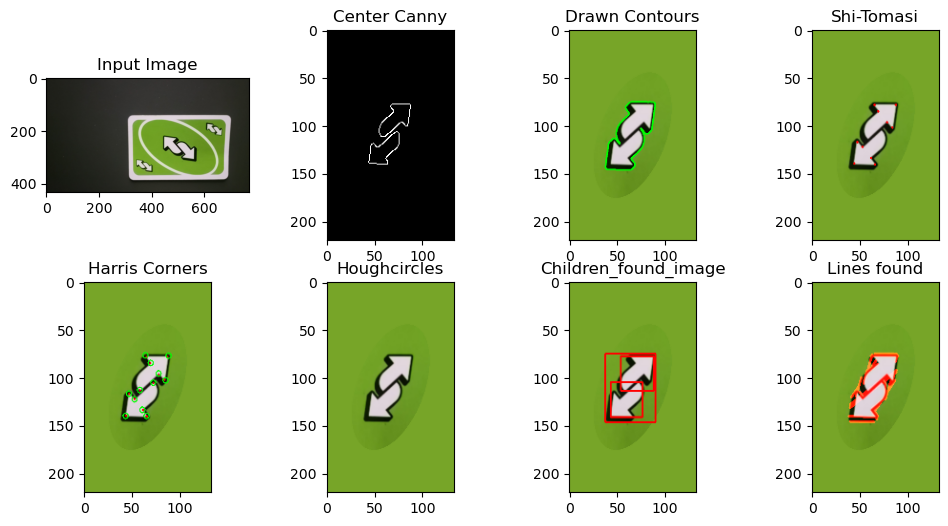




**GREEN REVERSE**




Select an identification option:
1. Identify a single card
2. Identify a folder of images
3. Identify using camera
0. Back to main menu
Enter the number of the option you want to select: 1


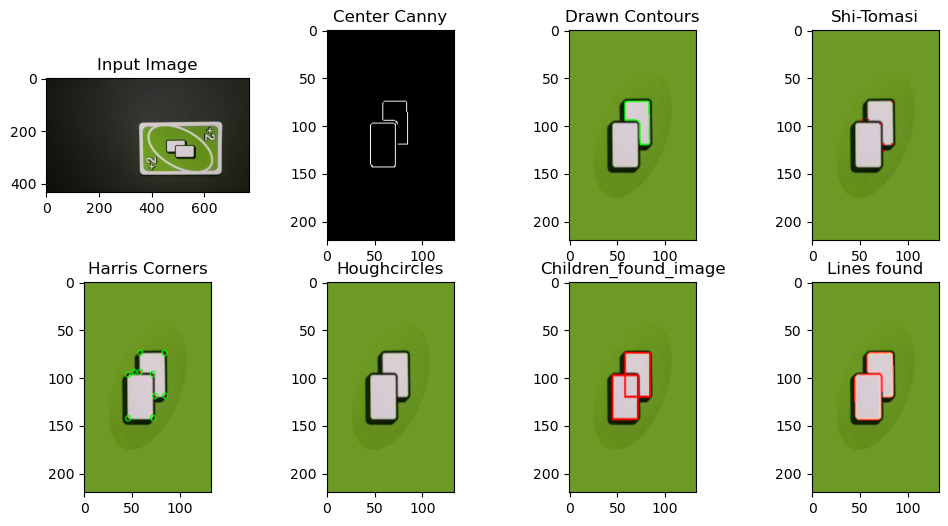




**GREEN PLUS 2**




Select an identification option:
1. Identify a single card
2. Identify a folder of images
3. Identify using camera
0. Back to main menu
Enter the number of the option you want to select: 1


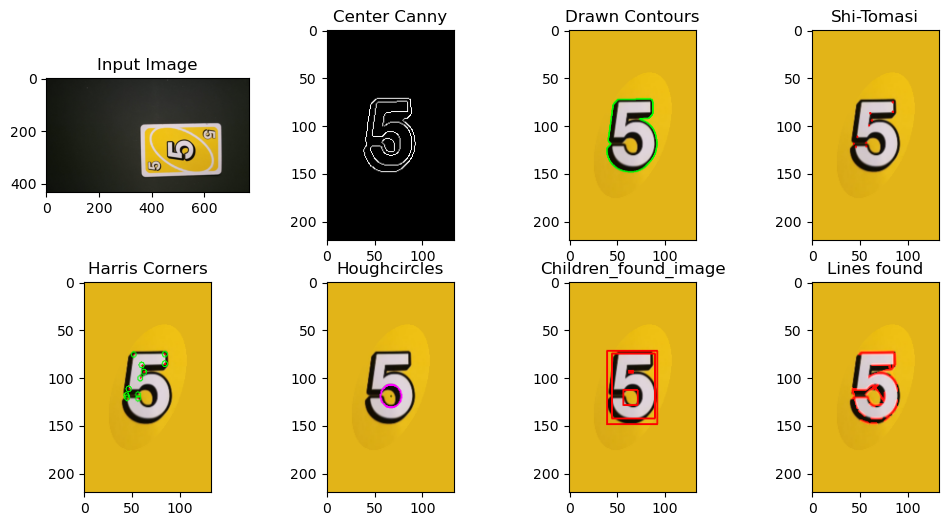




**YELLOW 5**




Select an identification option:
1. Identify a single card
2. Identify a folder of images
3. Identify using camera
0. Back to main menu
Enter the number of the option you want to select: 2


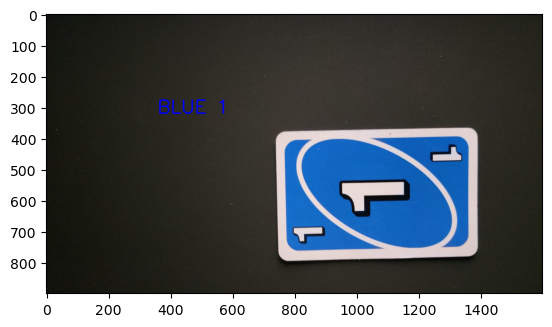

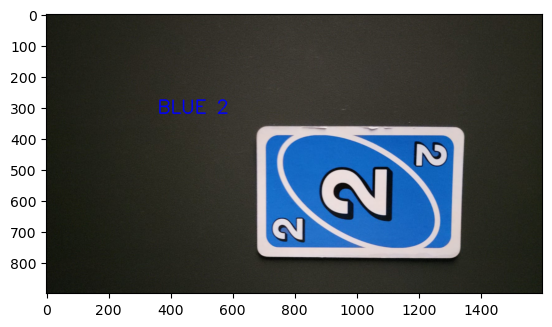

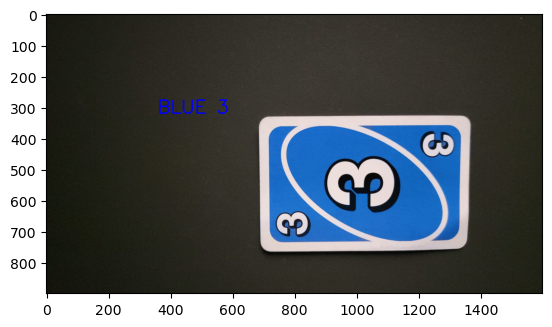

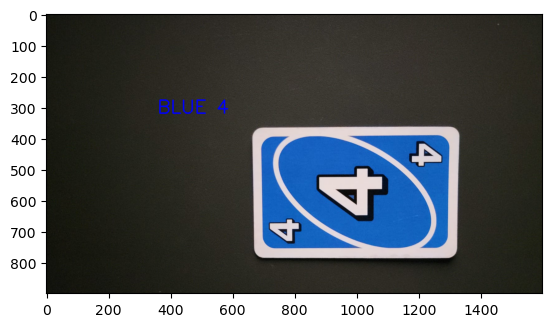

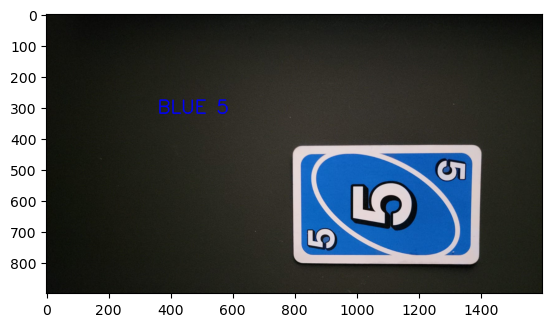

...

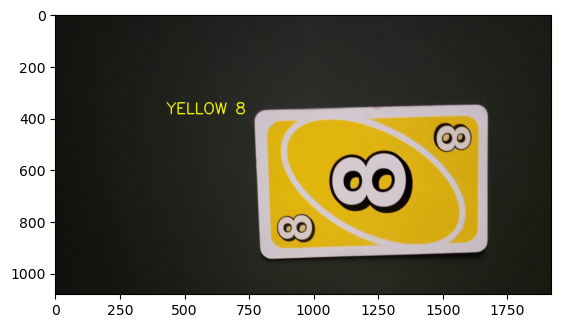

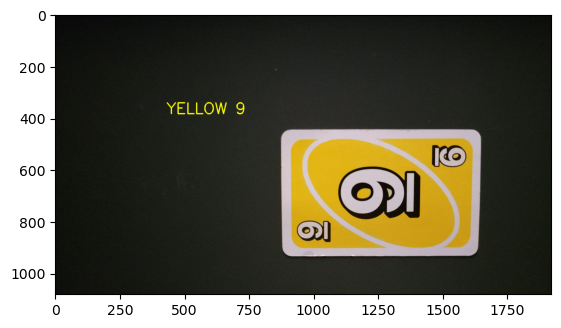

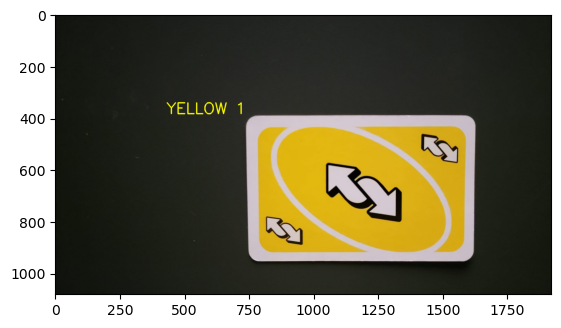

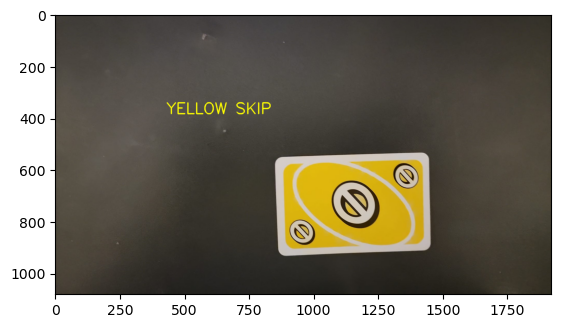

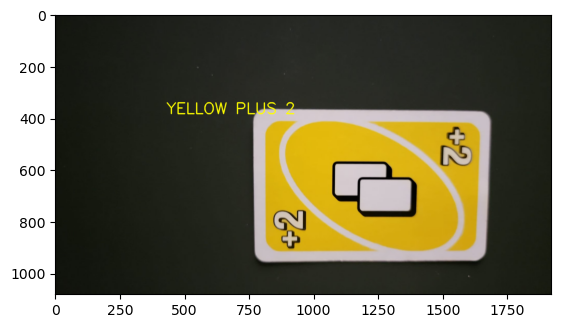

Accuracy: 94.0%
Select an identification option:
1. Identify a single card
2. Identify a folder of images
3. Identify using camera
0. Back to main menu
Enter the number of the option you want to select: 0
1. Create CSV dataset
2. Train RainForest classifier
3. Identify Uno cards
0. Exit
Enter your choice: 0


In [6]:
# Function to check for a classifier saved as a pickle file
def check_for_classifier():
    if glob.glob('dataset.csv'):
        if glob.glob('trained_rfc_classifier.p'):
            if input('File already exists. Press Y to replace the dataset or any other key to cancel: ').lower() == 'y':        
                classifier_training('./dataset.csv')
                print('Classifier training completed successfully!')
                return True
            else:
                print('Classifier training cancelled.')
                return False
        else:
            classifier_training('./dataset.csv')
            print('Classifier training completed successfully!')
            return True
    else:
        print('No dataset CSV available for classifier training.')
        return False
    
# To check if a dataset has been created already
def check_dataset(): 
    path = askdirectory()
    while True:
        if glob.glob('dataset.csv'):
            response = input('File already exists. Do you want to modify? Press 1 to modify or any other key to go back to the main menu:')
            if response == '1':
                response = input('Press 1 to replace the dataset.\nPress 2 to add to the existing dataset.\nPress 0 to go back to the main menu.')
                if response == '1':  
                    os.remove('dataset.csv')
                    create_dataset(str(path) + '/*.jpg')
                    break
                elif response == '2':
                    create_dataset(str(path) + '/*.jpg')
                    break
                elif response == '0':
                    break
                else:
                    print('Invalid input. Operation cancelled.')
            else:
                print('Operation cancelled.')
                break
        else:
            create_dataset(str(path) + '/*.jpg')
            break
    
# To Bring out identify cards menu   
def identify_cards():
    while True:
        print("Select an identification option:")
        print("1. Identify a single card")
        print("2. Identify a folder of images")
        print("3. Identify using camera")
        print("0. Back to main menu")

        selection = input("Enter the number of the option you want to select: ")

        if selection == "1":
            single_image()
        elif selection == "2":
            folder_image()
        elif selection == "3":
            identify_camera()
        elif selection == "0":
            return True  # Signal that the user wants to go back to the main menu
        else:
            print("Invalid selection. Please try again.")

def main():
    while True:
        # Display the menu options
        print("1. Create CSV dataset")
        print("2. Train RainForest classifier")
        print("3. Identify Uno cards")
        print("0. Exit")

        # Wait for user input
        choice = input("Enter your choice: ")

        # Execute the chosen function or exit the program
        if choice == "1":
            check_dataset()
        elif choice == "2":
            check_for_classifier()
        elif choice == "3":
            if identify_cards():
                continue  # Go back to the main menu
        elif choice == "0":
            break
        else:
            print("Invalid choice. Please try again.")

if __name__ == "__main__":

    main()
